[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://github.com/porterjenkins/byu-cs474/blob/master/lab7_style_transfer.ipynb)

# Style Transfer

In this lab, you will implement the style transfer algorithm proposed by [Gatys et. al. (2016)](https://arxiv.org/pdf/1508.06576.pdf). Your goal is to produce an image that has the high-level content of one image and the low-level style of another.

To perform style transfer, we will use a neural network as a feature extractor to determine style and content features, and we will optimize an image to reach a balance of the chosen style and content. Note that the network does not generate the final image, nor is the network trained at any point in this lab; instead of training network weights, we train the image itself. Through this lab, you will experience another way to use neural networks and see how deep learning can be used to optimize structures other than neural networks.


## Grading standards
Your code will be graded on the following:

* 20% Correct extraction of image statistics
* 35% Correct construction of loss function in a loss class
* 20% Plain English description of equations from (Gatys et. al. 2016) at the bottom of the notebook
* 15% Correct initialization and optimization of image variable
* 10% Awesome looking final image

---

## Intro

Here's an additional example of style transfer:

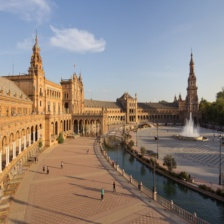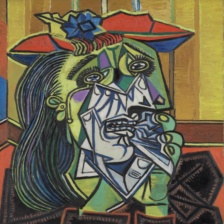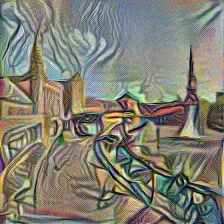

---

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from tqdm import tqdm
from torch.nn.parameter import Parameter
from PIL import Image
import io

# IF NOT USING COLAB: comment out the following import statement:
from google.colab import files

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Select two images: one for content and one for style. The images should have noticeably different content and style from each other to make it clear if the style transfer worked.

In [7]:
# Use this code to upload your own images.
# NOTE: if you are not using Colab, `upload()` will not work. Just make sure the images are on your file system and set `content_path` and `style_path` accordingly.

load_and_normalize = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

def upload():
  print('Upload Content Image')
  file_dict = files.upload()
  content_path = io.BytesIO(file_dict[next(iter(file_dict))])

  print('\nUpload Style Image')
  file_dict = files.upload()
  style_path = io.BytesIO(file_dict[next(iter(file_dict))])
  return content_path, style_path

content_path, style_path = upload()

print("Content Path: {}".format(content_path))
print("Style Path: {}".format(style_path))


Upload Content Image


Saving 1ilIeLwrS0iKjmQDfwAt4w_thumb_203d.jpg to 1ilIeLwrS0iKjmQDfwAt4w_thumb_203d.jpg

Upload Style Image


Saving ammon_defending_kings_sheep.jpeg to ammon_defending_kings_sheep (1).jpeg
Content Path: <_io.BytesIO object at 0x7e86dd5c1710>
Style Path: <_io.BytesIO object at 0x7e86dd56ca90>


In [8]:
# Load in and normalize the images
content_image_orig = Image.open(content_path)
content_image = load_and_normalize(content_image_orig).unsqueeze(0).to(device)
style_image_orig = Image.open(style_path)
style_image = load_and_normalize(style_image_orig).unsqueeze(0).to(device)


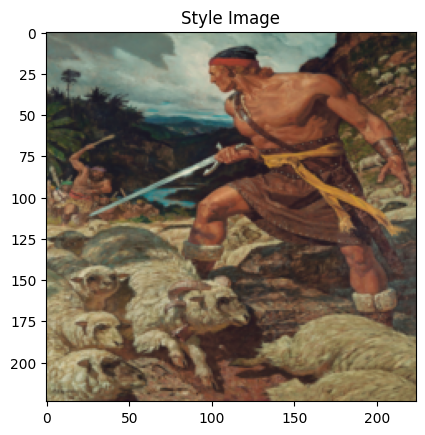

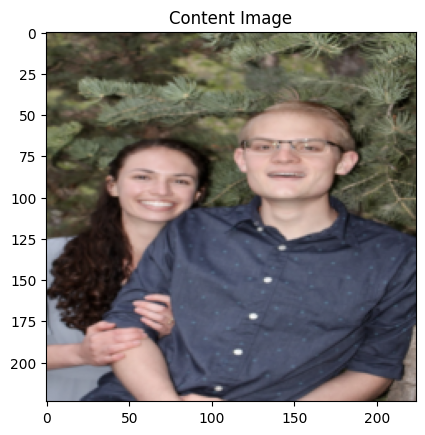

In [9]:
# Display the images
toPIL = transforms.ToPILImage()

def display(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = toPIL(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

plt.figure()
display(style_image, title='Style Image')

plt.figure()
display(content_image, title='Content Image')


___

## Part 1

We will use a pretrained VGG-16 network as a feature extractor to get the style and content statistics from the images.

We provide you with the `VGGIntermediate` class to load in the pretrained model and to grab intermediate layers.



* Correctly initialize a VGGIntermediate object to extract style and content
* Gather content statistics from the outputs of intermediate layers for the content image
* Gather style statistics for the style image

**DONE:**



In [10]:
import torchvision.models as models

# You should not have to change any of the code in the following classes.

# Normalization layer normalizes the image pixels to mean=0 std=1 according to the statistics of the ImageNet training dataset (which the VGG was pretrained on)
class Normalization(nn.Module):
  def __init__(self):
      super(Normalization, self).__init__()
      self.mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1).to(device)
      self.std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1).to(device)

  def forward(self, img):
      return (img - self.mean) / self.std

# Wrapper for the pretrained VGG-16. Instead of returning the output of the VGG, it returns the `requested` layers.
class VGGIntermediate(nn.Module):
  def __init__(self, requested=[]):
    super(VGGIntermediate, self).__init__()
    self.norm = Normalization().eval()
    self.intermediates = {}
    self.vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1).features.eval()
    for i, m in enumerate(self.vgg.children()):
        if isinstance(m, nn.ReLU):   # we want to set the relu layers to NOT do the relu in place.
          m.inplace = False          # the model has a hard time going backwards on the in place functions.

        if i in requested:
          # This stores the output of the requested layer as `intermediates[i]`
          def curry(i):
            def hook(module, input, output):
              self.intermediates[i] = output
            return hook
          m.register_forward_hook(curry(i))

  def forward(self, x):
    self.vgg(self.norm(x))
    return self.intermediates.copy()

We provide you with the list of VGG-16 layer names. Select the names of the layers you'd like to use to extract the content and style ([Gatys et. al. (2016)](https://arxiv.org/pdf/1508.06576.pdf) has suggestions on which layers to use).

Save the layer indexes (not names) into a list for the `requested` parameter of `VGGIntermediate`.

In [12]:
vgg_names = ["conv1_1", "relu1_1", "conv1_2", "relu1_2", "maxpool1", "conv2_1", "relu2_1", "conv2_2", "relu2_2", "maxpool2", "conv3_1", "relu3_1", "conv3_2", "relu3_2", "conv3_3", "relu3_3","maxpool3", "conv4_1", "relu4_1", "conv4_2", "relu4_2", "conv4_3", "relu4_3","maxpool4", "conv5_1", "relu5_1", "conv5_2", "relu5_2", "conv5_3", "relu5_3","maxpool5"]

In [22]:
requested = [17, 10, 5, 0]

Create a `VGGIntermediate` object, providing it with the intermediate layers. You can use a single network to extract both the content and the style, but be sure to keep track of which layers are which.

In [25]:
extractModel = VGGIntermediate(requested).to(device)

Use your `VGGIntermediate` network to extract the content from `content_image` and the style from `style_image`. Save these tensors: they will be used throughout training! Be sure to detach these tensors, since these are our labels and we don't want to backpropagate with respect to them.

In [48]:
styleTensors = extractModel(style_image)
for i in styleTensors:
  styleTensors[i] = styleTensors[i].detach()
contentTensor = extractModel(content_image)[17].detach()

---

## Part 2

The loss functions are key to learning the correct behavior in any machine learning problem. For style transfer, we have two losses: content loss and style loss. Our final loss is a combination of both to provide a balance between these competing objectives.

Show that you understand style transfer by describing the key equations of [Gatys et al. 2016](https://arxiv.org/pdf/1508.06576.pdf) in your own words. You may need to read the surrounding sections to understand the equations.

Content Loss:

- Describe equation (1) on p. 10 of (Gatys 2016) in plain English. Include the meaning of all variables and what each dimension represents for each matrix and vector variable.

$\mathcal{L}_{content}(\vec{p}, \vec{x}, l) = \frac{1}{2}\sum_{i,j} (F^l_{ij} - P^l_{ij})^2$

**My Answer**:
- The L is the loss of the model with regards to the content of the image
- The vector p holds the pixels of the original image that we are using for the content of the image that we are attempting to generate.
- The vector x holds the pixels of the generated image that we are attempting to refine.
- The l is the layer that we are looking at for the content from the trained vision model.
- The F holds the activations pulled from the model for the generated image.
- The P holds the activations pulled from the model for the original content image.
- F and P are matrices of size N x M (where N is the number of filters at the layer l and M is the product of the height and width of the image)
- The i in the sum refers to the filter i out of the total N filters
- The j in the sum refers to the jth pixel in that filter
- This loss is simply a sum squared loss of the activations for the original (content) and generated images.
- The 1/2 is simply a normalization factor

Style Loss:

- Describe equation (3) on p. 11 of (Gatys 2016) in plain English, including the meaning of all variables and what each dimension represents for each matrix and vector variable (including the output).

$G^l_{ij} = \sum_k F^l_{ik} F^l_{jk}$

**My Answer**:
- This is the Gram matrix (really just one entry in it)
- The l refers to the layer of interest in the model
- The i refers to the ith filter of the N filters in the l layer
- The j refers to the jth filter of the N filters in the l layer
- The k refers to the kth pixel of the image in the specific filter
- The F holds the activations for a given filter and pixel
- The whole right side of the equation is simply doing a dot product of the vectorized feature maps (a summing of the products of the same pixel in each of the two filters)


- Describe equation (4) on p. 11 of (Gatys 2016) in plain English, including the meaning of all variables and what each dimension represents for each matrix and vector variable.

$E_l = \frac{1}{4N_l^2M_l^2} \sum_{i,j} (G^l_{ij} - A^l_{ij})^2$

**My Answer**:
- The l refers to the layer
- The N refers to the number of filters in that layer
- The M refers to the size of the images (the product of height and width)
- The i refers to the ith filter of the N in the layer l
- The j refers to the jth filter of the N in the layer l
- The numbers/constants outside of the sum are a normalization factor
- The E refers to the contribution to the total loss of the layer l
- The A refers to the Gram matrix for the original image used for capturing style
- The G refers to the Gram matrix for the generated image
- They use the sum squared loss to find the difference between the style image and the generated image across all pairwise combinations of the N filters at layer l


- Describe equation (5) on p. 11 of (Gatys 2016) in plain English, including the meaning of all variables and subscripts.

$\mathcal{L}_{style}(\vec{a}, \vec{x}) = \sum^L_{l=0} w_lE_l$

**My Answer**:
- The L is the total loss of the model with regards to the style of the image
- The a refers to the data of the original style image
- The x refers to the data of the generated image
- The L is the number of layers in the network
- The l is the specific layer of the network that we are looking at
- The w is the weight assigned to a specific layer in the model
- The E is the loss of a specific layer, as calculated above

___

## Part 3
Now that you understand the loss functions mathematically, create modules that calculate the content and style loss for a single content or style layer.

Since the targets will be static throughout learning (the content and style images don't change, nor the network), we can store them in the loss module objects, so we don't have to pass them into the forward each time.

In [112]:
# Produces a gram matrix from a 4D tensor input
def gram_matrix(F):
  inter = F.view(F.shape[1], -1)
  return inter @ inter.transpose(0,1)


# Represents the content loss function for a single content layer
class ContentLoss(nn.Module):
  # Since the targets don't change, store the targets in the init
  def __init__(self, target):
      super().__init__()
      self.P = target.view(target.shape[1], -1)

  def forward(self, y_hat):
    F = y_hat.view(y_hat.shape[1], -1)
    return 0.5 * torch.sum((F - self.P) ** 2)

# Represents the style loss function for a single style layer
class StyleLoss(nn.Module):
  def __init__(self, target):
      super().__init__()
      self.target = target

  def forward(self, y_hat):
    A = gram_matrix(self.target)
    G = gram_matrix(y_hat)
    return (1 / (4 * A.shape[0] ** 2 * A.shape[1] ** 2)) * torch.sum((G - A) ** 2)

# Instantiate a content loss module for each content layer
#  with the content reference image outputs for that layer for comparison
contentLoss = ContentLoss(contentTensor)

# Instantiate a style loss module for each style layer
#  with the style reference image outputs for that layer for comparison
styleLoss1 = StyleLoss(styleTensors[0])
styleLoss2 = StyleLoss(styleTensors[5])
styleLoss3 = StyleLoss(styleTensors[10])
styleLoss4 = StyleLoss(styleTensors[17])


Now that you have a list of loss modules, write a loss function that computes the combined style transfer loss. You can weight the overall content and style losses, as well as weighting each layerwise loss value.

Return the combined loss as a tensor for learning. Return the content and style loss values for plotting.

In [208]:
def TotalLoss(activations):
  alpha = 0.000001
  beta = 1
  w = 0.2

  conLoss = contentLoss(activations[17])
  styLoss = w * (styleLoss1(activations[0]) + styleLoss2(activations[5]) + styleLoss3(activations[10]) + styleLoss4(activations[17]))

  loss = alpha * conLoss + beta * styLoss

  return loss, conLoss, styLoss

___

## Part 4
Create and run a method that minimizes the content and style loss for a copy of the content image

Note that the content loss should be zero if you take out the style loss. Why is that?

**TODO:**

* Use an Adam optimizer (try learning rate of .1, but feel free to experiment)
* Show both the content and the style loss every 50 steps
* Ensure that the outputs don't go out of range (clamp them)
* Display the tensor as an image!
* Experiment with different hyperparameters or network layers until you're satisfied with your final image

**DONE:**



First, we need to define our image. While we can create a random image and hope that the optimization works, the best results come from using a clone of the content image. That way, the image starts with the desired content and the content loss only needs to preserve the existing content.

Create a clone of the content image as your initial "generated" image. Calculate and print content and style loss (separately) for your generated image. What do you notice about these losses? Make sure the losses match what you'd expect, given that the generated image is a copy of the content image.

In [222]:
generated_image = content_image.clone()
extraction = extractModel(generated_image)
genLoss, genCon, genSty = TotalLoss(extraction)
print("Total Loss:\t", genLoss.item())
print("Content Loss:\t", genCon.item())
print("Style Loss:\t", genSty.item())

Total Loss:	 4689.85693359375
Content Loss:	 0.0
Style Loss:	 4689.85693359375


Prepare your generated image for optimization. You need two things:


1.   Your generated image must require gradients: set requires_grad to true by setting the object parameter `requires_grad` or calling the function `requires_grad_()`.
2.   Create an optimizer with your generated image as the parameter. Torch optimizers expect a list of parameters (or tensors), so you'll need to wrap your generated image in a single-item list for the optimizer.



In [223]:
# Prepare your generated image to learn
generated_image.requires_grad = True

# Create your optimizer: we suggest starting using an Adam optimizer with lr=.1
adam = optim.Adam([generated_image], lr = 0.001)

Now create and run your training loop, storing content and style losses as you train. Remember, you will be optimizing the **generated image** according to the content and style statistics extracted with the network. Print your final image.

For best results, use `torch.clamp(generated_im, 0, 1)` to keep your pixel values in range after each learning step.

Style transfer is very susceptible to overtraining, which introduces a lot of noise to the final image. Print your image often during the training process to find the best-looking image.

Content Loss: 0.0	Style Loss: 4689.85693359375



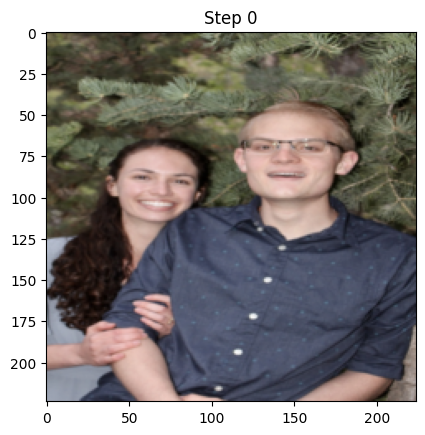

Content Loss: 6408140.5	Style Loss: 828.974609375

Content Loss: 7759923.0	Style Loss: 385.3406677246094

Content Loss: 8339167.5	Style Loss: 208.8819580078125

Content Loss: 8565554.0	Style Loss: 131.94522094726562



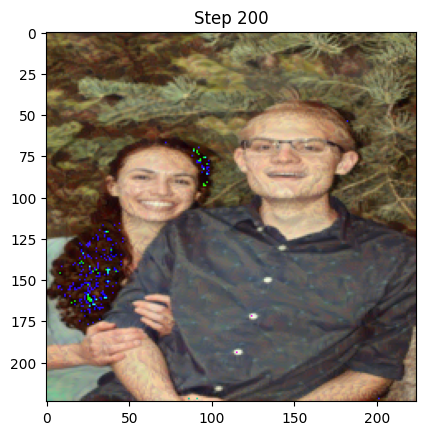

Content Loss: 8622464.0	Style Loss: 92.94335174560547

Content Loss: 8618610.0	Style Loss: 69.67210388183594

Content Loss: 8591400.0	Style Loss: 54.3158073425293

Content Loss: 8539138.0	Style Loss: 43.69009780883789



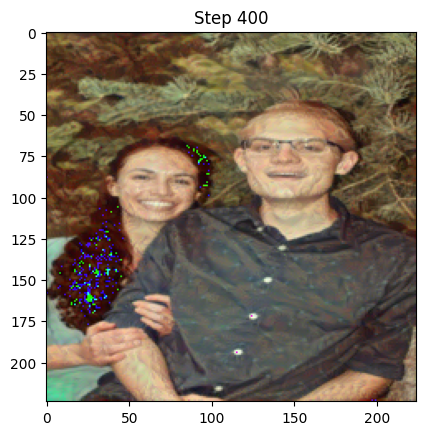

Content Loss: 8478261.0	Style Loss: 36.12430953979492

Content Loss: 8411133.0	Style Loss: 30.580108642578125

Content Loss: 8336850.0	Style Loss: 26.390134811401367

Content Loss: 8255459.5	Style Loss: 23.14226531982422



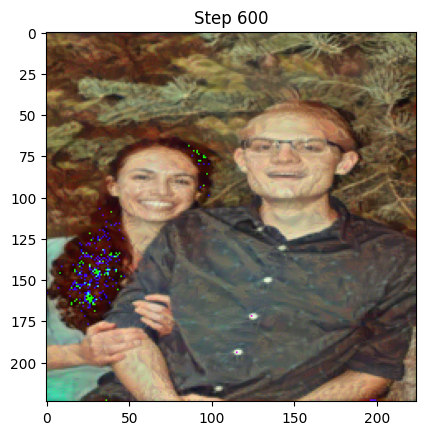

Content Loss: 8177260.0	Style Loss: 20.557830810546875

Content Loss: 8099553.0	Style Loss: 18.4622802734375

Content Loss: 8026507.0	Style Loss: 16.73301124572754

Content Loss: 7955650.5	Style Loss: 15.288461685180664



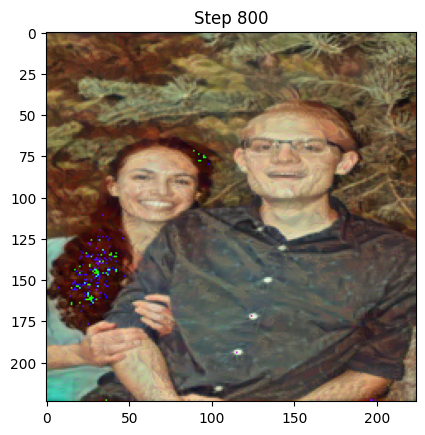

Content Loss: 7891774.5	Style Loss: 14.066571235656738

Content Loss: 7828428.0	Style Loss: 13.027552604675293

Content Loss: 7768564.5	Style Loss: 12.140474319458008

Content Loss: 7712519.0	Style Loss: 11.37682819366455



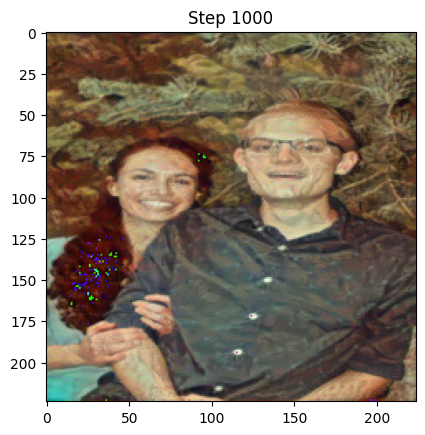

Content Loss: 7659932.0	Style Loss: 10.716218948364258

Content Loss: 7613314.0	Style Loss: 10.139389038085938

Content Loss: 7569559.5	Style Loss: 9.633763313293457

Content Loss: 7525536.5	Style Loss: 9.190142631530762



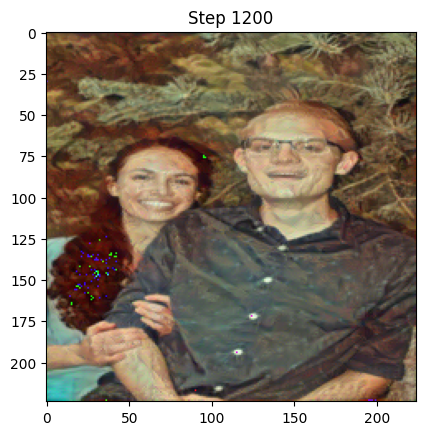

Content Loss: 7485756.0	Style Loss: 8.795819282531738

Content Loss: 7446159.0	Style Loss: 8.446640968322754

Content Loss: 7407946.0	Style Loss: 8.134587287902832

Content Loss: 7369865.0	Style Loss: 7.854555606842041



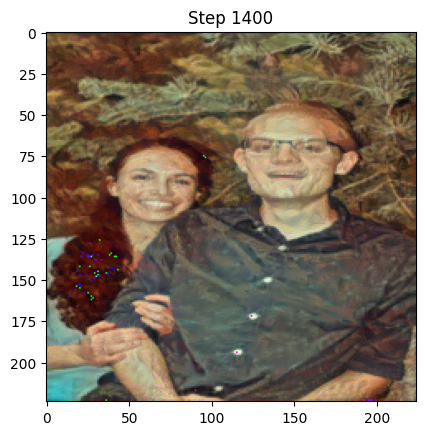

Content Loss: 7334061.0	Style Loss: 7.60248327255249

Content Loss: 7300259.0	Style Loss: 7.373999118804932

Content Loss: 7266724.0	Style Loss: 7.167251110076904

Content Loss: 7234375.5	Style Loss: 6.9791789054870605



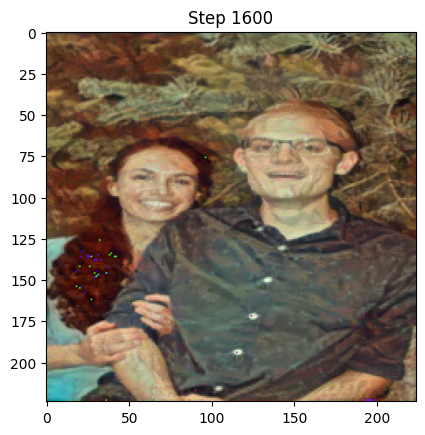

Content Loss: 7203251.0	Style Loss: 6.806766033172607

Content Loss: 7174350.0	Style Loss: 6.646907329559326

Content Loss: 7144562.5	Style Loss: 6.5015177726745605

Content Loss: 7116442.0	Style Loss: 6.365754127502441



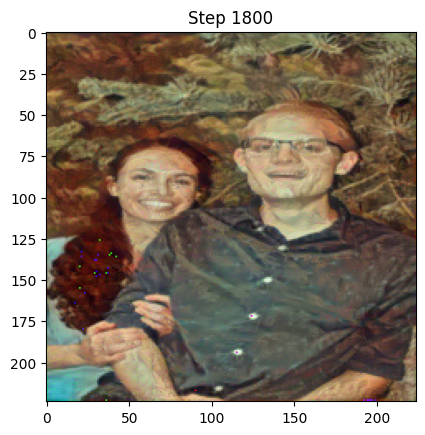

Content Loss: 7088364.0	Style Loss: 6.24014139175415

Content Loss: 7061880.5	Style Loss: 6.121696472167969

Content Loss: 7036675.0	Style Loss: 6.009731292724609

Content Loss: 7010699.0	Style Loss: 5.906160831451416



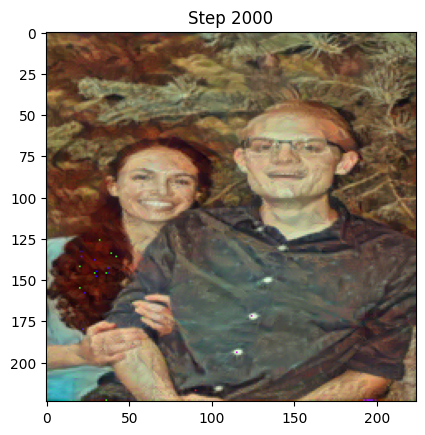

Content Loss: 6986372.0	Style Loss: 5.808190822601318

Content Loss: 6962447.0	Style Loss: 5.715836524963379

Content Loss: 6938860.5	Style Loss: 5.628657817840576

Content Loss: 6915346.0	Style Loss: 5.546442985534668



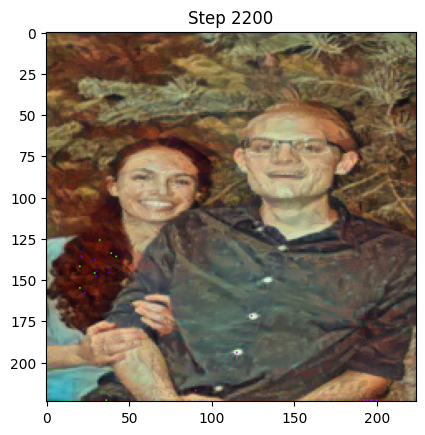

Content Loss: 6893294.0	Style Loss: 5.467427730560303

Content Loss: 6873184.0	Style Loss: 5.391391754150391

Content Loss: 6854137.0	Style Loss: 5.319246768951416

Content Loss: 6835129.0	Style Loss: 5.2505903244018555



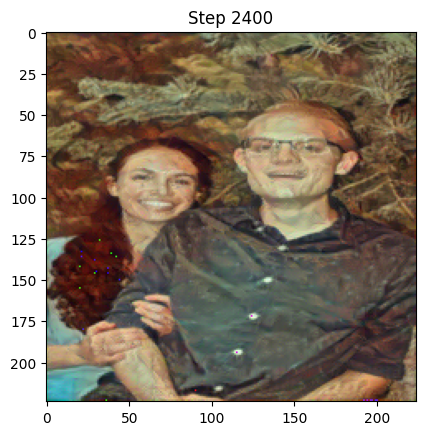

Content Loss: 6816044.0	Style Loss: 5.1851277351379395

Content Loss: 6796968.0	Style Loss: 5.1224236488342285

Content Loss: 6778177.5	Style Loss: 5.061831951141357

Content Loss: 6760004.5	Style Loss: 5.004002571105957



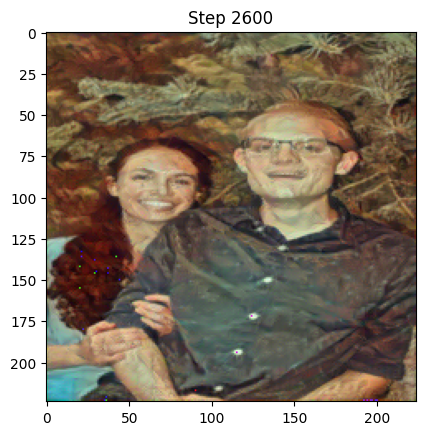

Content Loss: 6742198.0	Style Loss: 4.948788642883301

Content Loss: 6725072.0	Style Loss: 4.895326137542725

Content Loss: 6708085.0	Style Loss: 4.844069004058838

Content Loss: 6691476.0	Style Loss: 4.794713020324707



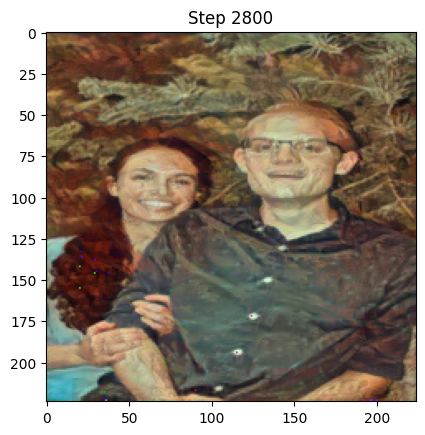

Content Loss: 6674643.0	Style Loss: 4.7473649978637695

Content Loss: 6658173.0	Style Loss: 4.70112419128418

Content Loss: 6641717.5	Style Loss: 4.656450271606445

Content Loss: 6625575.0	Style Loss: 4.61325216293335



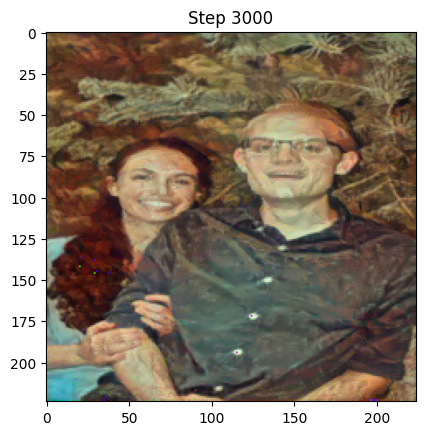

Content Loss: 6609976.0	Style Loss: 4.570930004119873

Content Loss: 6595422.0	Style Loss: 4.529196262359619

Content Loss: 6580415.0	Style Loss: 4.489501476287842

Content Loss: 6565429.0	Style Loss: 4.451516628265381



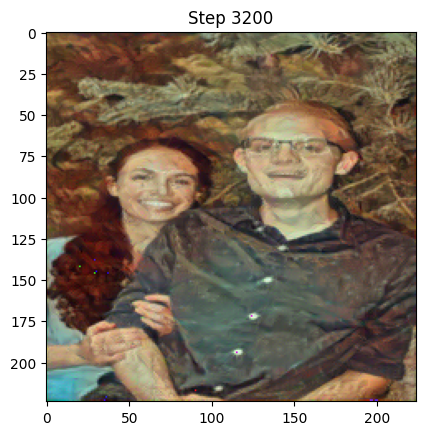

Content Loss: 6551219.5	Style Loss: 4.414439678192139

Content Loss: 6537965.0	Style Loss: 4.37819242477417

Content Loss: 6524864.0	Style Loss: 4.34332275390625

Content Loss: 6511384.0	Style Loss: 4.309858798980713



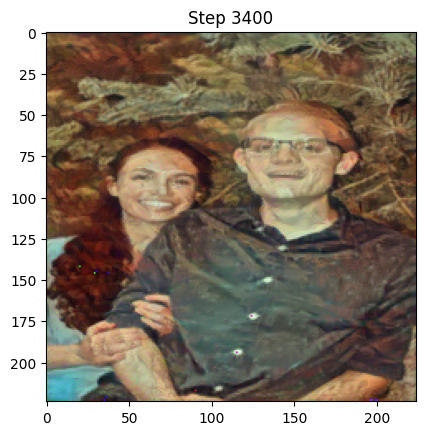

Content Loss: 6498811.0	Style Loss: 4.276444911956787

Content Loss: 6486495.5	Style Loss: 4.243947505950928

Content Loss: 6474643.0	Style Loss: 4.2120537757873535

Content Loss: 6462273.5	Style Loss: 4.1816511154174805



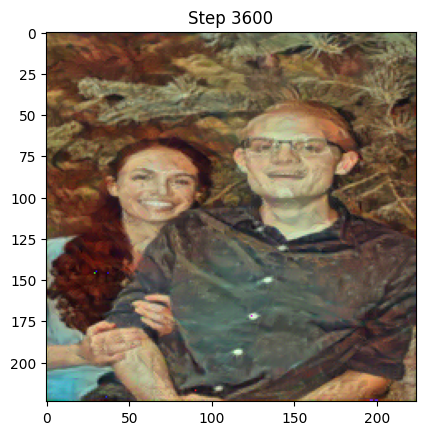

Content Loss: 6450223.0	Style Loss: 4.151802062988281

Content Loss: 6438983.0	Style Loss: 4.121968746185303

Content Loss: 6427624.5	Style Loss: 4.092906951904297

Content Loss: 6416043.5	Style Loss: 4.065363883972168



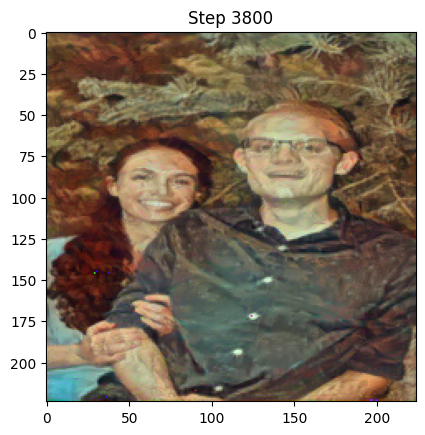

Content Loss: 6404702.5	Style Loss: 4.0386199951171875

Content Loss: 6394058.5	Style Loss: 4.012272357940674

Content Loss: 6383063.0	Style Loss: 3.987083911895752

Content Loss: 6372294.5	Style Loss: 3.9627671241760254



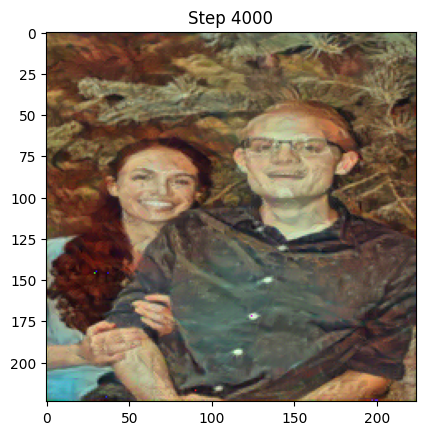

Content Loss: 6362210.5	Style Loss: 3.9385643005371094

Content Loss: 6351248.0	Style Loss: 3.9160187244415283

Content Loss: 6341783.0	Style Loss: 3.8924012184143066

Content Loss: 6333596.0	Style Loss: 3.870651960372925



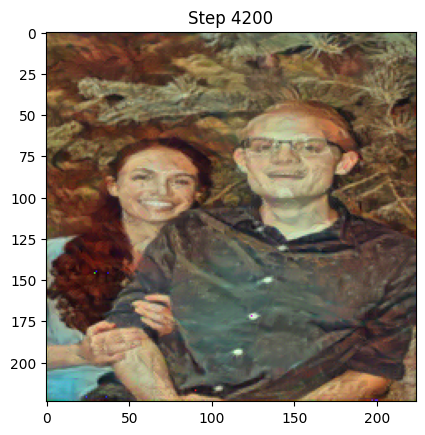

Content Loss: 6325268.0	Style Loss: 3.850821018218994

Content Loss: 6317197.0	Style Loss: 3.831794023513794

Content Loss: 6308541.0	Style Loss: 3.814119815826416

Content Loss: 6299980.0	Style Loss: 3.792797803878784



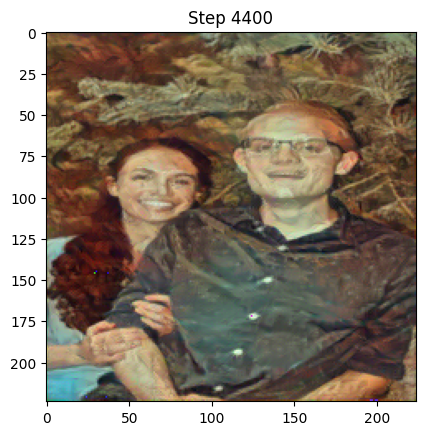

Content Loss: 6291926.0	Style Loss: 3.77510142326355

Content Loss: 6283884.0	Style Loss: 3.756413221359253

Content Loss: 6275682.0	Style Loss: 3.7355873584747314

Content Loss: 6266153.5	Style Loss: 3.7176291942596436



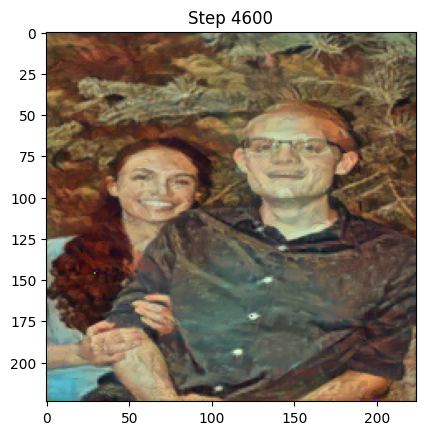

Content Loss: 6260056.0	Style Loss: 3.7439587116241455

Content Loss: 6253704.0	Style Loss: 3.7081992626190186

Content Loss: 6242427.0	Style Loss: 3.659050703048706

Content Loss: 6238357.0	Style Loss: 3.649733304977417



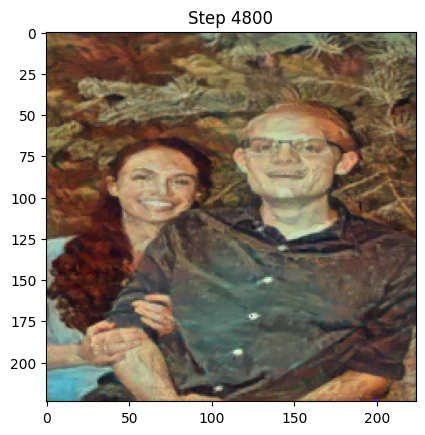

Content Loss: 6225945.0	Style Loss: 3.6240715980529785

Content Loss: 6219541.0	Style Loss: 3.605095624923706

Content Loss: 6207848.0	Style Loss: 3.5974392890930176

Content Loss: 6200249.0	Style Loss: 3.5796661376953125



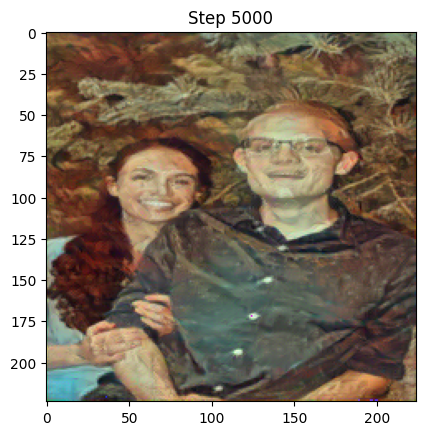

Content Loss: 6191251.0	Style Loss: 3.6180121898651123

Content Loss: 6184559.0	Style Loss: 3.547576665878296

Content Loss: 6180222.0	Style Loss: 3.529844045639038

Content Loss: 6181191.0	Style Loss: 3.5304791927337646



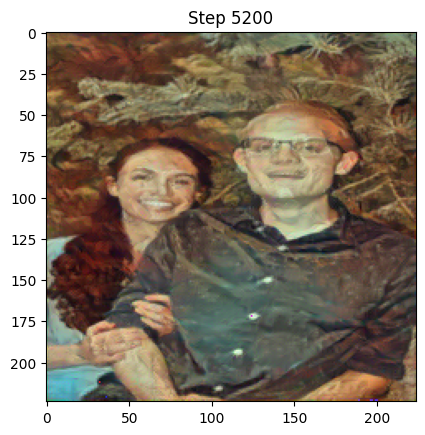

Content Loss: 6170921.5	Style Loss: 3.5388810634613037

Content Loss: 6168710.5	Style Loss: 3.4965133666992188

Content Loss: 6161841.0	Style Loss: 3.5199623107910156

Content Loss: 6151612.5	Style Loss: 3.484349489212036



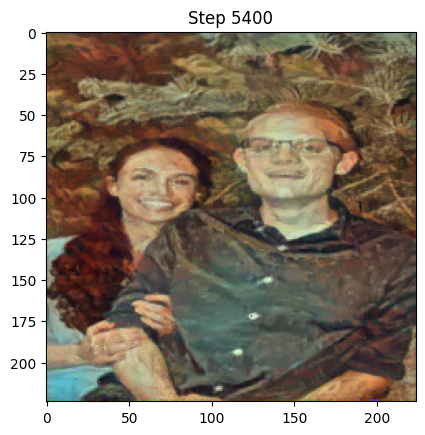

Content Loss: 6137642.5	Style Loss: 3.499311923980713

Content Loss: 6141636.5	Style Loss: 3.4797699451446533

Content Loss: 6126357.5	Style Loss: 3.4546375274658203

Content Loss: 6123904.0	Style Loss: 3.475943088531494



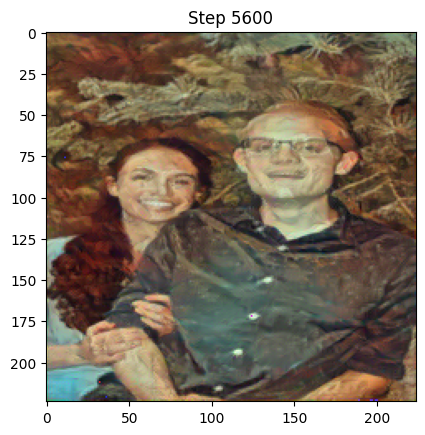

Content Loss: 6110540.5	Style Loss: 3.43566632270813

Content Loss: 6115084.0	Style Loss: 3.4014065265655518

Content Loss: 6112894.0	Style Loss: 3.3881423473358154

Content Loss: 6105805.0	Style Loss: 3.3943848609924316



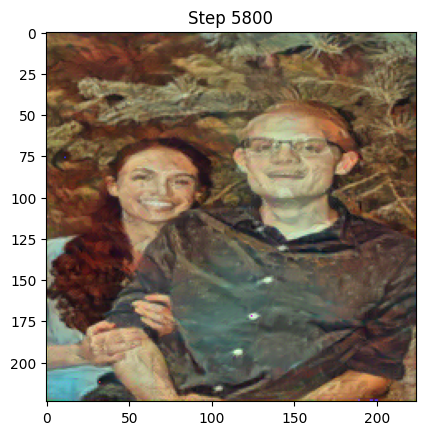

Content Loss: 6100349.0	Style Loss: 3.3995652198791504

Content Loss: 6100344.5	Style Loss: 3.389394760131836

Content Loss: 6082456.5	Style Loss: 3.3530189990997314

Content Loss: 6089893.5	Style Loss: 3.368900775909424



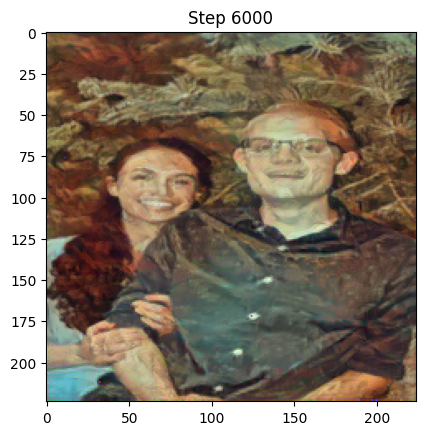

Content Loss: 6072900.0	Style Loss: 3.329909563064575

Content Loss: 6065776.0	Style Loss: 3.360250949859619

Content Loss: 6065968.5	Style Loss: 3.3078999519348145

Content Loss: 6055799.5	Style Loss: 3.3266358375549316



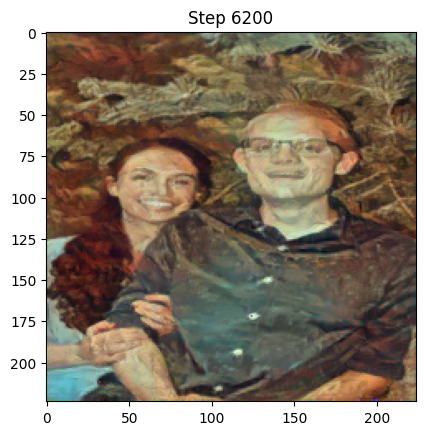

Content Loss: 6046866.0	Style Loss: 3.3881301879882812

Content Loss: 6052069.0	Style Loss: 3.323415756225586

Content Loss: 6041368.0	Style Loss: 3.3165249824523926

Content Loss: 6038616.5	Style Loss: 3.278717517852783



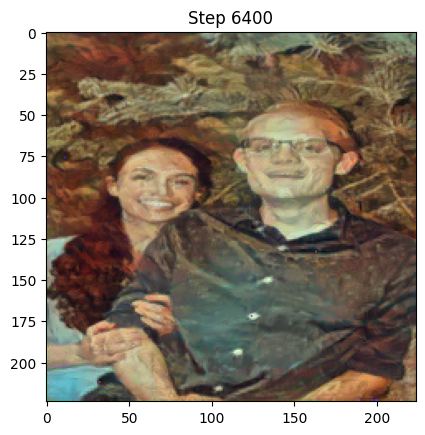

Content Loss: 6037195.0	Style Loss: 3.2723851203918457

Content Loss: 6045759.5	Style Loss: 3.3638885021209717

Content Loss: 6030580.0	Style Loss: 3.2619590759277344

Content Loss: 6038376.5	Style Loss: 3.261007070541382



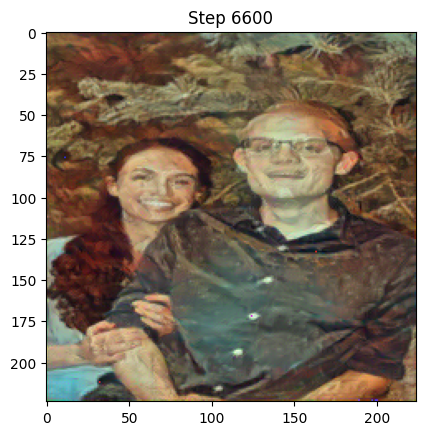

Content Loss: 6023783.0	Style Loss: 3.2383382320404053

Content Loss: 6018603.5	Style Loss: 3.2973549365997314

Content Loss: 6025235.5	Style Loss: 3.2765777111053467

Content Loss: 6018094.0	Style Loss: 3.2801854610443115



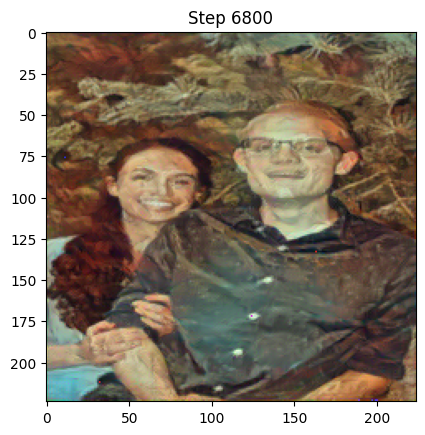

Content Loss: 6011562.0	Style Loss: 3.261730194091797

Content Loss: 6011161.5	Style Loss: 3.227705478668213

Content Loss: 6003302.0	Style Loss: 3.215871810913086

Content Loss: 6001836.0	Style Loss: 3.207873582839966



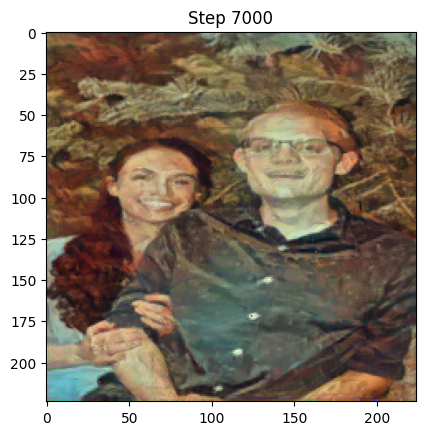

Content Loss: 5999432.0	Style Loss: 3.393763780593872

Content Loss: 5999343.0	Style Loss: 3.1748085021972656

Content Loss: 5986723.0	Style Loss: 3.1875386238098145

Content Loss: 5994614.5	Style Loss: 3.179534673690796



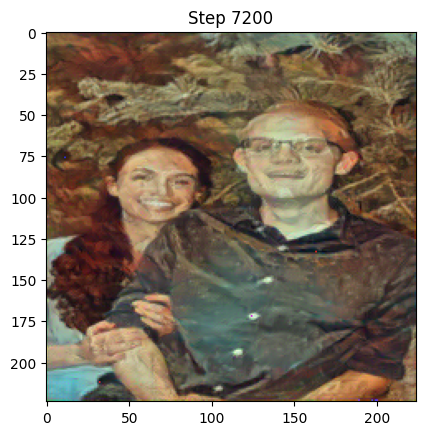

Content Loss: 5982495.0	Style Loss: 3.2282066345214844

Content Loss: 5981847.5	Style Loss: 3.162750482559204

Content Loss: 5974668.0	Style Loss: 3.185256004333496

Content Loss: 5971143.0	Style Loss: 3.1804540157318115



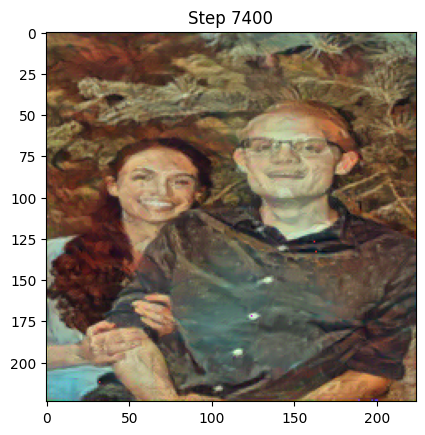

Content Loss: 5985272.5	Style Loss: 3.1600844860076904

Content Loss: 5970074.0	Style Loss: 3.142230987548828

Content Loss: 5968102.0	Style Loss: 3.1407110691070557

Content Loss: 5962603.0	Style Loss: 3.1414432525634766



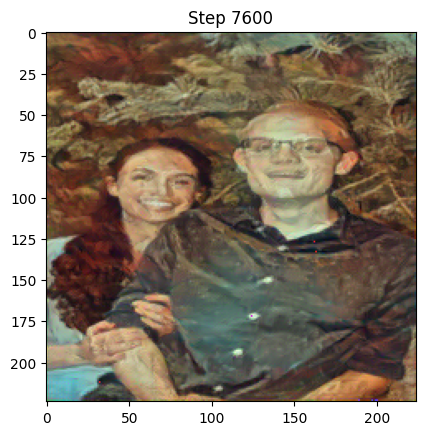

Content Loss: 5972793.0	Style Loss: 3.136671781539917

Content Loss: 5966685.5	Style Loss: 3.160137891769409

Content Loss: 5954993.5	Style Loss: 3.124678134918213

Content Loss: 5959458.0	Style Loss: 3.143728017807007



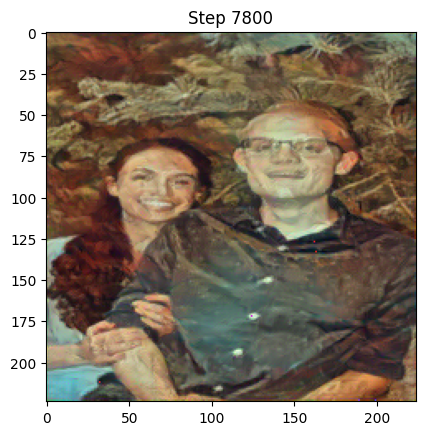

Content Loss: 5956138.5	Style Loss: 3.1509621143341064

Content Loss: 5946587.0	Style Loss: 3.1392502784729004

Content Loss: 5954180.0	Style Loss: 3.105773448944092



In [224]:
plt.figure()

conLosses = []
styLosses = []

optimSteps = 8000

for i in range(optimSteps):

  extraction = extractModel(generated_image)

  loss, con, sty = TotalLoss(extraction)

  conLosses.append(con.item())
  styLosses.append(sty.item())

  loss.backward()
  adam.step()
  adam.zero_grad()

  torch.clamp(generated_image, 0, 1)

  if i % 50 == 0:
    print(f"Content Loss: {con}\tStyle Loss: {sty}\n")

  if i % 200 == 0:
    plt.clf()
    display(generated_image, title=f'Step {i}')
    plt.pause(0.1)


Plot your content and style losses. Content loss should start at 0 and increase as style loss decreases. They should both reach an equilibrium.

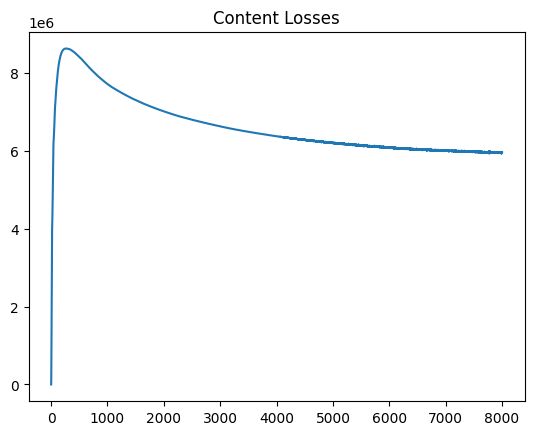

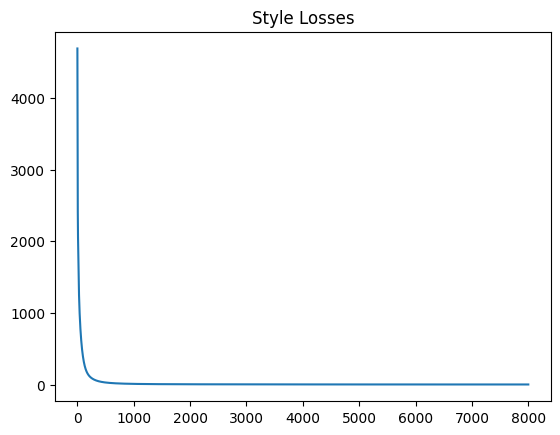

In [225]:
x = np.arange(1,optimSteps+1)

plt.figure()
plt.plot(x, conLosses)
plt.title("Content Losses")
plt.show()

plt.figure()
plt.plot(x, styLosses)
plt.title("Style Losses")
plt.show()

Now that you have style transfer working, the results may not look very appealing. Different content and style images require different hyperparameters, so you should play around with different network layers, learning rates, and loss weighting to get the best results.